In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [0]:
training_data = spark.read.csv("s3://ascentt-wl-training-s3/Khush Agrawal/twitter_training.csv", inferSchema=True)

display(training_data)

_c0,_c1,_c2,_c3
2401,Borderlands,Positive,"im getting on borderlands and i will murder you all ,"
2401,Borderlands,Positive,"I am coming to the borders and I will kill you all,"
2401,Borderlands,Positive,"im getting on borderlands and i will kill you all,"
2401,Borderlands,Positive,"im coming on borderlands and i will murder you all,"
2401,Borderlands,Positive,"im getting on borderlands 2 and i will murder you me all,"
2401,Borderlands,Positive,"im getting into borderlands and i can murder you all,"
2402,Borderlands,Positive,So I spent a few hours making something for fun. . . If you don't know I am a HUGE @Borderlands fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg
2402,Borderlands,Positive,"So I spent a couple of hours doing something for fun... If you don't know that I'm a huge @ Borderlands fan and Maya is one of my favorite characters, I decided to make a wallpaper for my PC.. Here's the original picture compared to the creation I made:) Have fun! pic.twitter.com / mLsI5wf9Jg"
2402,Borderlands,Positive,So I spent a few hours doing something for fun... If you don't know I'm a HUGE @ Borderlands fan and Maya is one of my favorite characters.
2402,Borderlands,Positive,So I spent a few hours making something for fun. . . If you don't know I am a HUGE RhandlerR fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg


#Data Cleaning

In [0]:
training_data = training_data.withColumnRenamed("_c0", "id") \
                             .withColumnRenamed("_c1", "source") \
                             .withColumnRenamed("_c2", "sentiment") \
                             .withColumnRenamed("_c3", "text")

display(training_data)

id,source,sentiment,text
2401,Borderlands,Positive,"im getting on borderlands and i will murder you all ,"
2401,Borderlands,Positive,"I am coming to the borders and I will kill you all,"
2401,Borderlands,Positive,"im getting on borderlands and i will kill you all,"
2401,Borderlands,Positive,"im coming on borderlands and i will murder you all,"
2401,Borderlands,Positive,"im getting on borderlands 2 and i will murder you me all,"
2401,Borderlands,Positive,"im getting into borderlands and i can murder you all,"
2402,Borderlands,Positive,So I spent a few hours making something for fun. . . If you don't know I am a HUGE @Borderlands fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg
2402,Borderlands,Positive,"So I spent a couple of hours doing something for fun... If you don't know that I'm a huge @ Borderlands fan and Maya is one of my favorite characters, I decided to make a wallpaper for my PC.. Here's the original picture compared to the creation I made:) Have fun! pic.twitter.com / mLsI5wf9Jg"
2402,Borderlands,Positive,So I spent a few hours doing something for fun... If you don't know I'm a HUGE @ Borderlands fan and Maya is one of my favorite characters.
2402,Borderlands,Positive,So I spent a few hours making something for fun. . . If you don't know I am a HUGE RhandlerR fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg


In [0]:
from pyspark.sql.functions import col, count, when

null_counts = training_data.select([count(when(col(c).isNull(), c)).alias(c) for c in training_data.columns])
display(null_counts)

id,source,sentiment,text
0,0,0,686


In [0]:
testing_data = spark.read.csv("s3://ascentt-wl-training-s3/Khush Agrawal/twitter_validation.csv", header=True, inferSchema=True)

display(testing_data)

3364,Facebook,Irrelevant,"I mentioned on Facebook that I was struggling for motivation to go for a run the other day, which has been translated by Tom’s great auntie as ‘Hayley can’t get out of bed’ and told to his grandma, who now thinks I’m a lazy, terrible person 🤣"
352,Amazon,Neutral,BBC News - Amazon boss Jeff Bezos rejects claims company acted like a 'drug dealer' bbc.co.uk/news/av/busine…
8312,Microsoft,Negative,@Microsoft Why do I pay for WORD when it functions so poorly on my @SamsungUS Chromebook? 🙄
4371,CS-GO,Negative,"CSGO matchmaking is so full of closet hacking, it's a truly awful game."
4433,Google,Neutral,Now the President is slapping Americans in the face that he really did commit an unlawful act after his acquittal! From Discover on Google vanityfair.com/news/2020/02/t…
6273,FIFA,Negative,"Hi @EAHelp I’ve had Madeleine McCann in my cellar for the past 13 years and the little sneaky thing just escaped whilst I was loading up some fifa points, she took my card and I’m having to use my paypal account but it isn’t working, can you help me resolve it please?"
7925,MaddenNFL,Positive,Thank you @EAMaddenNFL!!
New TE Austin Hooper in the ORANGE & BROWN!!,null,null,null
#Browns | @AustinHooper18,null,null,null
"pic.twitter.com/GRg4xzFKOn""",null,null,null
11332,TomClancysRainbowSix,Positive,"Rocket League, Sea of Thieves or Rainbow Six: Siege🤔? I love playing all three on stream but which is the best? #stream #twitch #RocketLeague #SeaOfThieves #RainbowSixSiege #follow"


In [0]:
cleaned_training_data = training_data.filter(col("_c0").isNotNull())

In [0]:
from pyspark.sql.functions import col

null_counts = cleaned_training_data.select([count(when(col(c).isNull(), c)).alias(c) for c in cleaned_training_data.columns])
display(null_counts)

id,source,sentiment,text
0,0,0,686


In [0]:
cleaned_training_data = cleaned_training_data.filter(col("text").isNotNull())

null_counts = cleaned_training_data.select([count(when(col(c).isNull(), c)).alias(c) for c in cleaned_training_data.columns])
display(null_counts)

id,source,sentiment,text
0,0,0,0


#Text Preprocessing

In [0]:
from pyspark.ml.feature import Tokenizer, StopWordsRemover
from pyspark.sql.functions import lower, regexp_replace
cleaned_training_data = cleaned_training_data.withColumn("text", lower(col("text")))

In [0]:
cleaned_training_data = cleaned_training_data.withColumn("text", regexp_replace(col("text"), r"http\S+|[^a-zA-Z\s]", ""))

In [0]:
tokenizer = Tokenizer(inputCol="text", outputCol="words")
tokenized_data = tokenizer.transform(cleaned_training_data)

In [0]:
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
processed_data = remover.transform(tokenized_data)
processed_data.select("filtered_words").display(truncate=False)

filtered_words
"List(im, getting, borderlands, murder)"
"List(coming, borders, kill)"
"List(im, getting, borderlands, kill)"
"List(im, coming, borderlands, murder)"
"List(im, getting, borderlands, , murder)"
"List(im, getting, borderlands, murder)"
"List(spent, hours, making, something, fun, , , dont, know, huge, borderlands, fan, maya, one, favorite, characters, decided, make, wallpaper, pc, , original, image, versus, creation, made, , enjoy, pictwittercommlsiwfjg)"
"List(spent, couple, hours, something, fun, dont, know, im, huge, , borderlands, fan, maya, one, favorite, characters, decided, make, wallpaper, pc, heres, original, picture, compared, creation, made, fun, pictwittercom, , mlsiwfjg)"
"List(spent, hours, something, fun, dont, know, im, huge, , borderlands, fan, maya, one, favorite, characters)"
"List(spent, hours, making, something, fun, , , dont, know, huge, rhandlerr, fan, maya, one, favorite, characters, decided, make, wallpaper, pc, , original, image, versus, creation, made, , enjoy, pictwittercommlsiwfjg)"


#Training Model - Naive Bayes

In [0]:
from pyspark.ml.feature import CountVectorizer
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.feature import StringIndexer

In [0]:
# Convert words to count vectors (Bag of Words model)
vectorizer = CountVectorizer(inputCol="filtered_words", outputCol="features")
vectorized_data = vectorizer.fit(processed_data).transform(processed_data)

In [0]:
# Convert sentiment to a numerical label
indexer = StringIndexer(inputCol="sentiment", outputCol="label")
final_data = indexer.fit(vectorized_data).transform(vectorized_data)


In [0]:
# Split data into training and testing
train_data, test_data = final_data.randomSplit([0.8, 0.2], seed=42)

# Initialize and train the Naive Bayes model
nb = NaiveBayes(featuresCol="features", labelCol="label")
nb_model = nb.fit(train_data)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

In [0]:
# Test the model
predictions = nb_model.transform(test_data)
predictions.select("label", "prediction", "probability").show()

+-----+----------+--------------------+
|label|prediction|         probability|
+-----+----------+--------------------+
|  0.0|       0.0|[0.53847559923975...|
|  0.0|       0.0|[0.99988377554117...|
|  0.0|       0.0|[0.99401949935535...|
|  2.0|       2.0|[0.00555822656806...|
|  0.0|       0.0|[0.96119929570589...|
|  0.0|       0.0|[0.96845005823165...|
|  3.0|       0.0|[0.99865657621160...|
|  2.0|       2.0|[0.00526737246908...|
|  0.0|       0.0|[0.47043806771666...|
|  0.0|       2.0|[0.21889892692164...|
|  0.0|       0.0|[0.50140821117565...|
|  0.0|       2.0|[0.12039487406936...|
|  0.0|       2.0|[0.38371469015118...|
|  2.0|       2.0|[6.05154257609081...|
|  2.0|       2.0|[9.03737304212623...|
|  1.0|       1.0|[1.14678480047832...|
|  1.0|       1.0|[0.08538774582426...|
|  1.0|       2.0|[2.86343143151074...|
|  1.0|       2.0|[3.22731662227644...|
|  1.0|       2.0|[4.91351894651089...|
+-----+----------+--------------------+
only showing top 20 rows



In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print(f"Model Accuracy: {accuracy}")


Model Accuracy: 0.7306167099685491


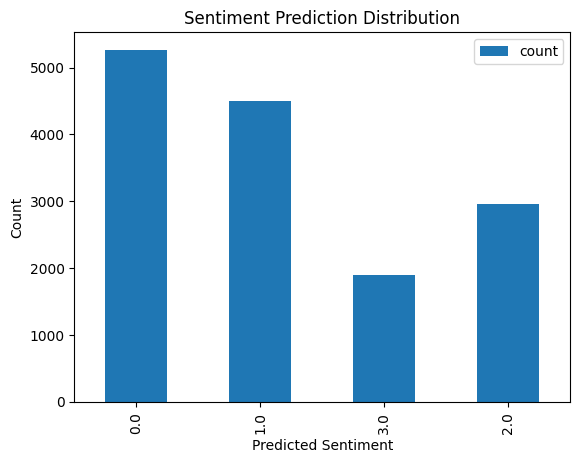

In [0]:
# Visualize sentiment distribution
sentiment_distribution = predictions.groupBy("prediction").count().toPandas()
sentiment_distribution.plot(kind="bar", x="prediction", y="count")
plt.title("Sentiment Prediction Distribution")
plt.xlabel("Predicted Sentiment")
plt.ylabel("Count")
plt.show()


In [0]:
# Visualize the proportion of each sentiment in the final data
from pyspark.sql.functions import col

sentiment_proportion = final_data.groupBy("sentiment").count()
total = sentiment_proportion.groupBy().sum("count").collect()[0][0]
sentiment_proportion = sentiment_proportion.withColumn("proportion", col("count") / total)

display(sentiment_proportion.select("sentiment", "proportion"))

sentiment,proportion
Irrelevant,0.17399589166982
Positive,0.27913671009243746
Neutral,0.24471593059084276
Negative,0.3021514676468998
